In [1]:
from imutils import paths
import numpy as np
import shutil
import cv2
import os

import matplotlib.patches as patches
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
def make_dir(dirName):
    # Create a target directory & all intermediate 
    # directories if they don't exists
    if not os.path.exists(dirName):
        os.makedirs(dirName, exist_ok = True)
        print("[INFO] Directory " ,dirName,  " created")
    else:
        print("[INFO] Directory " ,dirName,  " already exists") 

In [3]:
# path to the dataset
DATASET = "/workspace/original-external/birds"

In [4]:
# Read txt file and store image names with index
imagesList = open(os.path.join(DATASET, "images.txt"), "r")
nameDict = {}
for imageData in imagesList:
    idx, imageDir = imageData[:-1].split(" ")
    idx = int(idx) - 1
    nameDict[idx] = imageDir
    print(idx, imageDir)
N = len(nameDict)

0 001.Black_footed_Albatross/Black_Footed_Albatross_0046_18.jpg
1 001.Black_footed_Albatross/Black_Footed_Albatross_0009_34.jpg
2 001.Black_footed_Albatross/Black_Footed_Albatross_0002_55.jpg
3 001.Black_footed_Albatross/Black_Footed_Albatross_0074_59.jpg
4 001.Black_footed_Albatross/Black_Footed_Albatross_0014_89.jpg
5 001.Black_footed_Albatross/Black_Footed_Albatross_0085_92.jpg
6 001.Black_footed_Albatross/Black_Footed_Albatross_0031_100.jpg
7 001.Black_footed_Albatross/Black_Footed_Albatross_0051_796103.jpg
8 001.Black_footed_Albatross/Black_Footed_Albatross_0010_796097.jpg
9 001.Black_footed_Albatross/Black_Footed_Albatross_0025_796057.jpg
10 001.Black_footed_Albatross/Black_Footed_Albatross_0023_796059.jpg
11 001.Black_footed_Albatross/Black_Footed_Albatross_0086_796062.jpg
12 001.Black_footed_Albatross/Black_Footed_Albatross_0049_796063.jpg
13 001.Black_footed_Albatross/Black_Footed_Albatross_0006_796065.jpg
14 001.Black_footed_Albatross/Black_Footed_Albatross_0040_796066.jpg
15

In [5]:
# read txt file with landmark coordinates
labelsList = open(os.path.join(DATASET, "parts/part_locs.txt"), "r")
data = np.zeros((N, 15, 2))

# for each landmark coordinate store it into numpy array by image index
for labelData in labelsList:
    idx, labelIdx, x, y, _ = labelData[:-1].split(" ")    # idx - image index, labelIdx - index of landmark (beak, left eye, etc.)
    idx, labelIdx, x, y = int(idx)-1, int(labelIdx)-1, float(x), float(y)
    data[idx, labelIdx, 0] = x
    data[idx, labelIdx, 1] = y
    
    print(idx, labelIdx, x, y)

0 0 0.0 0.0
0 1 312.0 182.0
0 2 0.0 0.0
0 3 0.0 0.0
0 4 186.0 45.0
0 5 247.0 79.0
0 6 0.0 0.0
0 7 0.0 0.0
0 8 0.0 0.0
0 9 100.0 221.0
0 10 183.0 101.0
0 11 0.0 0.0
0 12 0.0 0.0
0 13 0.0 0.0
0 14 215.0 194.0
1 0 228.0 138.0
1 1 282.0 154.0
1 2 0.0 0.0
1 3 248.0 158.0
1 4 266.0 141.0
1 5 272.0 144.0
1 6 0.0 0.0
1 7 0.0 0.0
1 8 208.0 102.0
1 9 256.0 141.0
1 10 270.0 146.0
1 11 0.0 0.0
1 12 234.0 193.0
1 13 163.0 155.0
1 14 260.0 155.0
2 0 227.0 213.0
2 1 376.0 160.0
2 2 0.0 0.0
2 3 325.0 243.0
2 4 324.0 121.0
2 5 349.0 128.0
2 6 0.0 0.0
2 7 0.0 0.0
2 8 170.0 198.0
2 9 288.0 169.0
2 10 336.0 136.0
2 11 0.0 0.0
2 12 199.0 237.0
2 13 42.0 201.0
2 14 327.0 174.0
3 0 221.0 179.0
3 1 126.0 203.0
3 2 0.0 0.0
3 3 190.0 215.0
3 4 157.0 180.0
3 5 145.0 187.0
3 6 153.0 189.0
3 7 0.0 0.0
3 8 238.0 245.0
3 9 182.0 183.0
3 10 0.0 0.0
3 11 0.0 0.0
3 12 235.0 133.0
3 13 337.0 211.0
3 14 174.0 207.0
4 0 0.0 0.0
4 1 194.0 147.0
4 2 132.0 159.0
4 3 154.0 153.0
4 4 177.0 137.0
4 5 183.0 139.0
4 6 0.0 0.0
4 7

In [6]:
data[0]

array([[  0.,   0.],
       [312., 182.],
       [  0.,   0.],
       [  0.,   0.],
       [186.,  45.],
       [247.,  79.],
       [  0.,   0.],
       [  0.,   0.],
       [  0.,   0.],
       [100., 221.],
       [183., 101.],
       [  0.,   0.],
       [  0.,   0.],
       [  0.,   0.],
       [215., 194.]])

In [7]:
def show_image(i):
    
    # Load and display the image
    image = cv2.imread(os.path.join(DATASET, 'images', nameDict[i]))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(12, 8), dpi=80)
    plt.imshow(image)
    
    # Display head region landmarks
    plt.scatter(data[i, [1, 4, 5,  9, 14], 0], data[i, [1, 4, 5,  9, 14], 1], c='green', s=5)

    # Get the top-bottom, left-right boundaries around head landmarks
    xs = min(data[i, [1, 4, 5,  9, 14], 0])
    ys = min(data[i, [1, 4, 5,  9, 14], 1])
    xe = max(data[i, [1, 4, 5,  9, 14], 0])
    ye = max(data[i, [1, 4, 5,  9, 14], 1])
    
    # Adjust and display bounding box    
    h = ye-ys
    w = xe-xs
    
    ys -= 0.2*h                # extend top
    ye += 0.1*h                # extend bottom
    
    if xs == data[i, 1, 0]:    # if beak is on the left, extend left
        xs -= 0.3*w
    elif xe == data[i, 1, 0]:  # if beak is on the right, extend right
        xe += 0.3*w
    else:                      # if beak does not define boundary, extend both sides
        xs -= 0.15*w
        xe += 0.15*w
        
    ax = plt.gca()
    rect = patches.Rectangle((xs, ys), xe-xs, ye-ys, linewidth=1, edgecolor='r',facecolor='none')
    ax.add_patch(rect)

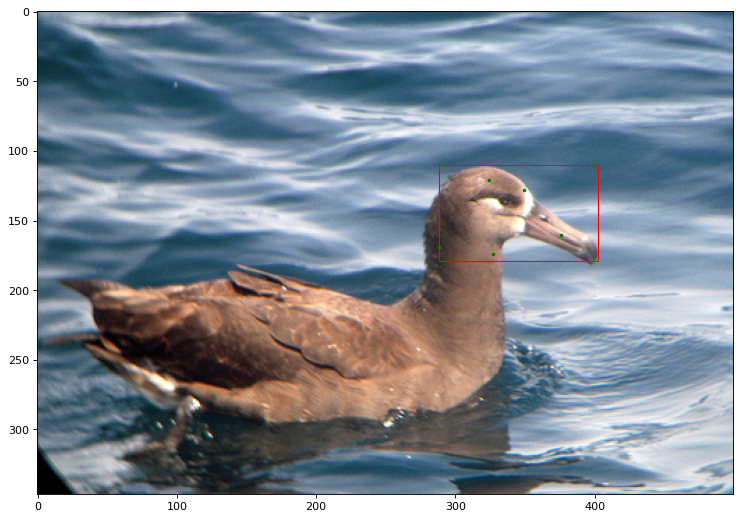

In [8]:
show_image(2)

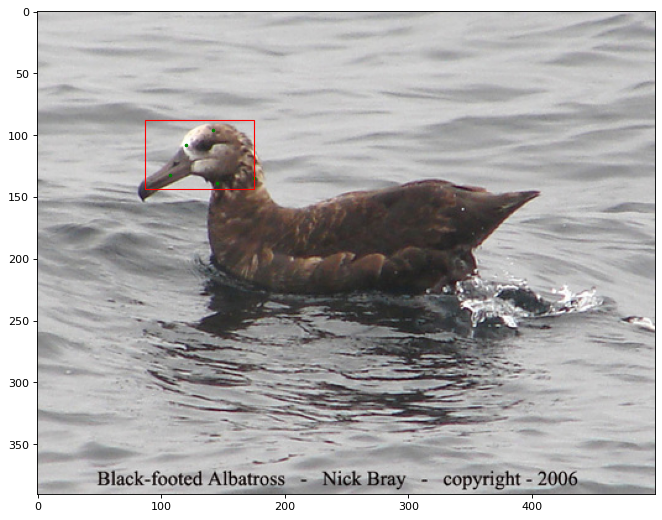

In [9]:
show_image(7)

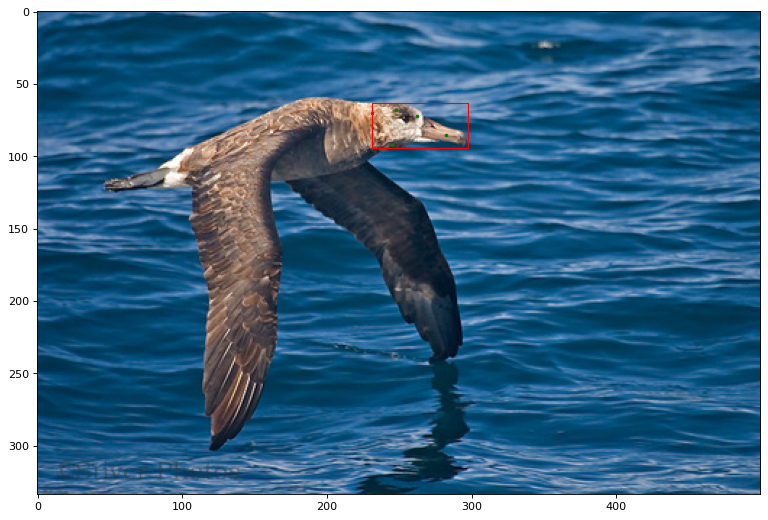

In [187]:
show_image(17)

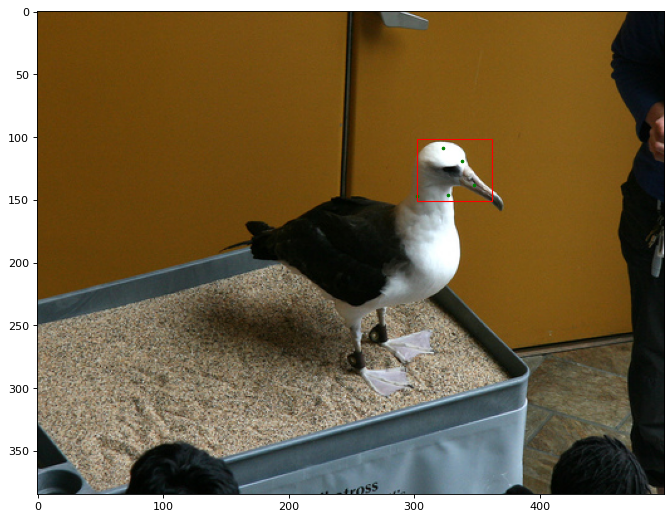

In [188]:
show_image(111)

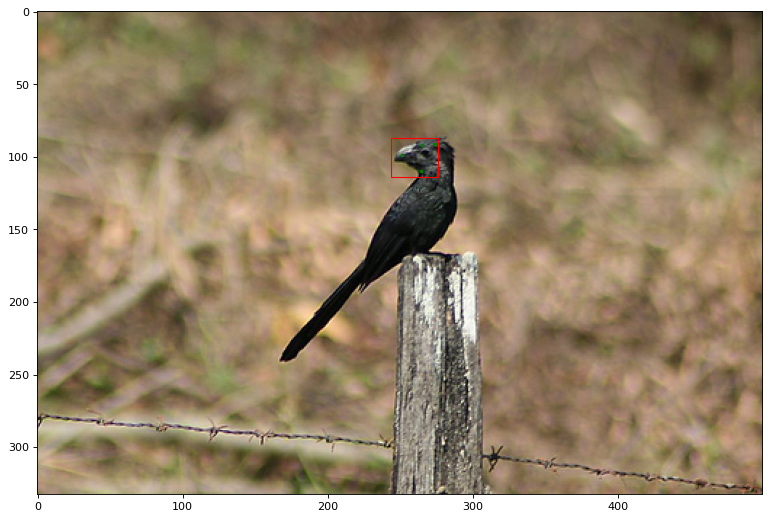

In [189]:
show_image(200)

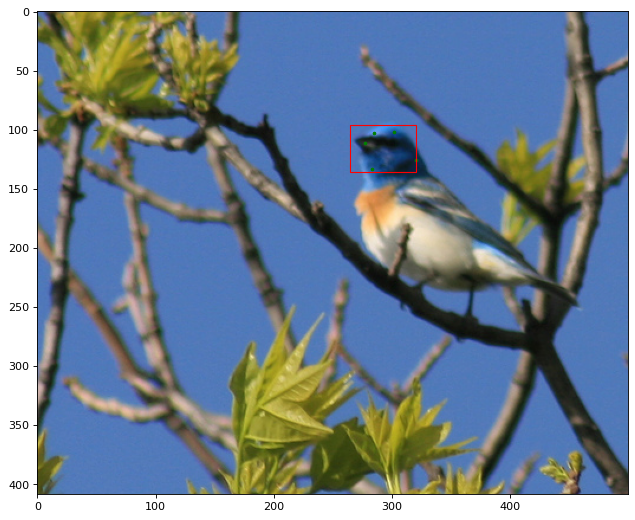

In [190]:
show_image(800)

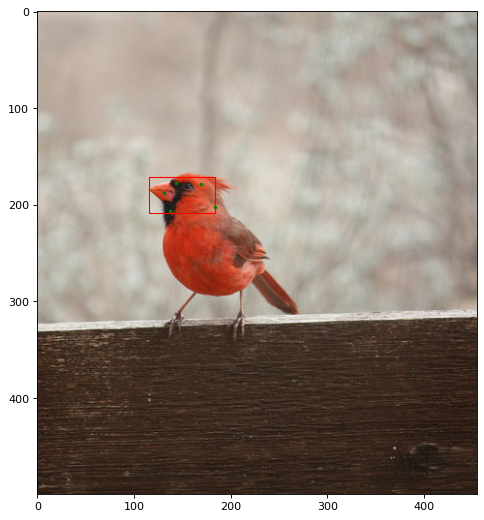

In [191]:
show_image(900)

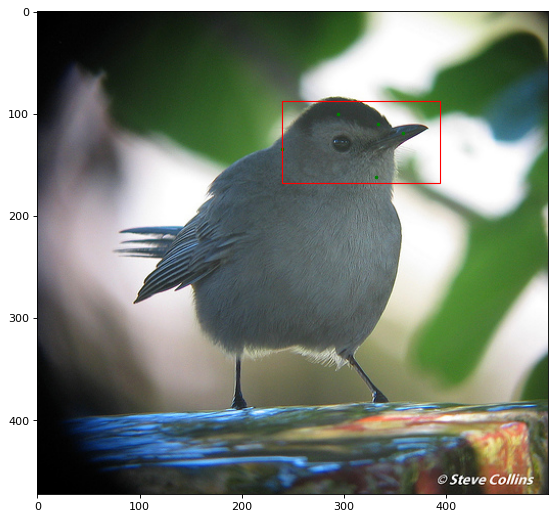

In [192]:
show_image(1000)

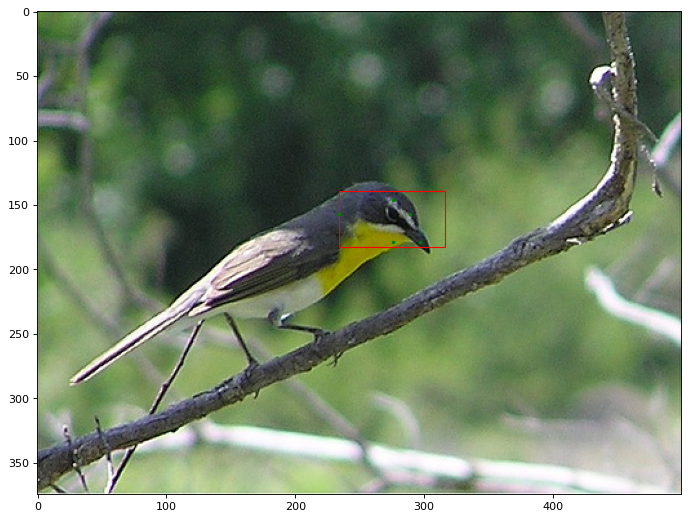

In [193]:
show_image(1100)

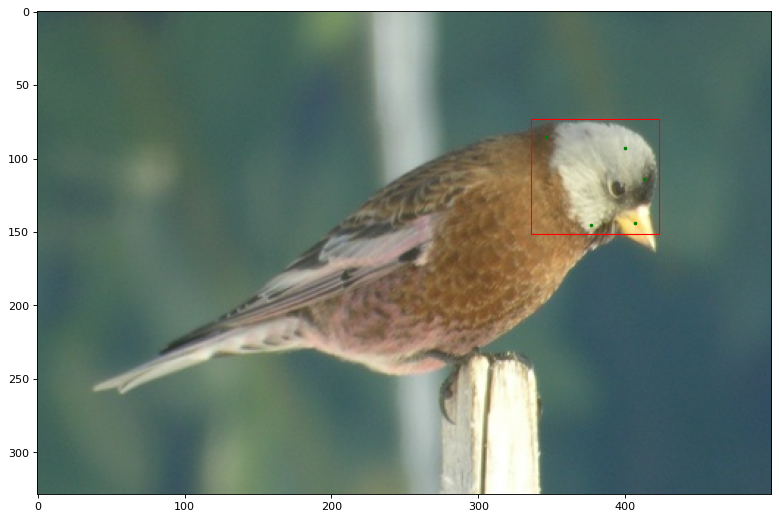

In [194]:
show_image(1900)

In [10]:
# Create new directories for images and labels
NEW_DATASET = "dataset/birds"
make_dir(os.path.join(NEW_DATASET, 'images'))
make_dir(os.path.join(NEW_DATASET, 'labels_eval'))

[INFO] Directory  dataset-test/birds/images  created
[INFO] Directory  dataset-test/birds/labels_eval  created


In [11]:
# Copy images
for i in range(N):
    src = os.path.join(DATASET, 'images', nameDict[i])
    des = os.path.join(NEW_DATASET, 'images', nameDict[i].split('/')[-1])
    shutil.copyfile(src, des)

In [13]:
for i in range(N):
    print("Processing: {}/{}".format(i, N))
    
    # Get the top-bottom, left-right boundaries around head landmarks
    xs = min(data[i, [1, 4, 5,  9, 14], 0])
    ys = min(data[i, [1, 4, 5,  9, 14], 1])
    xe = max(data[i, [1, 4, 5,  9, 14], 0])
    ye = max(data[i, [1, 4, 5,  9, 14], 1])
    
    # Adjust and write bounding box information
    h = ye-ys
    w = xe-xs
    
    ys -= 0.2*h                # extend top
    ye += 0.1*h                # extend bottom
    
    if xs == data[i, 1, 0]:    # if beak is on the left, extend left
        xs -= 0.3*w
    elif xe == data[i, 1, 0]:  # if beak is on the right, extend right
        xe += 0.3*w
    else:                      # if beak does not define boundary, extend both sides
        xs -= 0.15*w
        xe += 0.15*w
        
    labelFile = open("{}.txt".format(os.path.join(NEW_DATASET, 'labels_eval', nameDict[i].split('/')[-1].split('.')[0])), "w")
    labelFile.write('face {} {} {} {} -1 -1 -1 -1 -1 -1 -1 -1 -1 -1\n'.format(xs, ys, xe-xs, ye-ys))
    labelFile.close()

Processing: 0/11788
Processing: 1/11788
Processing: 2/11788
Processing: 3/11788
Processing: 4/11788
Processing: 5/11788
Processing: 6/11788
Processing: 7/11788
Processing: 8/11788
Processing: 9/11788
Processing: 10/11788
Processing: 11/11788
Processing: 12/11788
Processing: 13/11788
Processing: 14/11788
Processing: 15/11788
Processing: 16/11788
Processing: 17/11788
Processing: 18/11788
Processing: 19/11788
Processing: 20/11788
Processing: 21/11788
Processing: 22/11788
Processing: 23/11788
Processing: 24/11788
Processing: 25/11788
Processing: 26/11788
Processing: 27/11788
Processing: 28/11788
Processing: 29/11788
Processing: 30/11788
Processing: 31/11788
Processing: 32/11788
Processing: 33/11788
Processing: 34/11788
Processing: 35/11788
Processing: 36/11788
Processing: 37/11788
Processing: 38/11788
Processing: 39/11788
Processing: 40/11788
Processing: 41/11788
Processing: 42/11788
Processing: 43/11788
Processing: 44/11788
Processing: 45/11788
Processing: 46/11788
Processing: 47/11788
Pr